In [ ]:
from google.colab import drive
drive.mount('/content/drive/') 

Mounted at /content/drive/


In [ ]:
!unzip "/content/drive/My Drive/Colab Notebooks/AI/SRGAN/anime_faces_organized.zip"

Output streaming troncato alle ultime 5000 righe.
  inflating: __MACOSX/anime_faces_organized/15562/._25609819_result.jpg  
  inflating: anime_faces_organized/15562/25609819_resultdownsampled.jpg  
  inflating: anime_faces_organized/66090/74688128_resultdownsampled.jpg  
  inflating: anime_faces_organized/66090/74688128_result.jpg  
  inflating: __MACOSX/anime_faces_organized/66090/._74688128_result.jpg  
  inflating: anime_faces_organized/21757/31779349_result.jpg  
  inflating: __MACOSX/anime_faces_organized/21757/._31779349_result.jpg  
  inflating: anime_faces_organized/21757/31779349_resultdownsampled.jpg  
  inflating: anime_faces_organized/4135/14321240_resultdownsampled.jpg  
  inflating: anime_faces_organized/4135/14321240_result.jpg  
  inflating: __MACOSX/anime_faces_organized/4135/._14321240_result.jpg  
  inflating: anime_faces_organized/71027/79520538_result.jpg  
  inflating: __MACOSX/anime_faces_organized/71027/._79520538_result.jpg  
  inflating: anime_faces_organized/

In [ ]:
import glob
import cv2
import torch
import torchvision.transforms as T
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from torchvision.transforms import Compose

class AnimeFaceDataset(Dataset):
    def __init__(self):
        self.imgs_path = "anime_faces_organized/"
        # retrieve the list of images in the specified path
        folder_list = glob.glob(self.imgs_path + "*")
        self.data = []
        for class_path in folder_list:
            class_name = class_path.split("/")[-1]
            file_names = []
            for img_path in glob.glob(class_path + "/*.jpg"):
                file_names.append(img_path)
            self.data.append([file_names, class_name])

    def __len__(self):
        return len(self.data)
  
    def __getitem__(self, idx):
        img_paths, class_name = self.data[idx]
        class_id = int(class_name)
        imgs_tensors = {}
        for img_path in img_paths:
          img = cv2.imread(img_path)
          img_tensor = torch.from_numpy(img)
          # swap tensor's dimensions in order to have a tensor with the following structure : (C_in, W, H)
          img_tensor = img_tensor.permute(2, 0, 1)
          image_name = img_path.split("/")
          image_name = image_name[len(image_name)-1]
          image_type = "low_res"
          # normalizing pixel's values to the interval (0,1)
          img_tensor = img_tensor / 255
          # se è ad alta risoluzione
          if "downsampled" not in image_name:
            image_type = "high_res"
            # normalizing pixels' values to the interval (-1,1)
            img_tensor = 2 * img_tensor - 1
            # resing to 226x226 in order to match the image outputted by the generator (i.e. the upscaled image)
            transform = T.Resize((226,226)) 
            img_tensor = transform(img_tensor)  
        
          imgs_tensors[image_type] = img_tensor

        return imgs_tensors, class_id

In [ ]:
from torch import Tensor
from torch.nn import Module
from torch.optim import SGD
from torch.nn import MSELoss
from torch.nn import PReLU, Conv2d, BatchNorm2d, ModuleList, PixelShuffle

# each residual block can be made into a Class
class Generator(Module):

    def __init__(self):
        super(Generator, self).__init__()

        self.conv_1 = Conv2d(in_channels=3, out_channels=64, kernel_size=9, stride=1, padding=1)
        self.leaky_relu_1 = PReLU()

        self.num_of_residual_blocks = 16
        self.residual_blocks = ModuleList([ModuleList() for i in range(self.num_of_residual_blocks)])

        for num_block in range(self.num_of_residual_blocks):
          self.conv_2 = Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1)
          self.batch_norm_1 = BatchNorm2d(64)
          self.leaky_relu_2 = PReLU()

          self.conv_3 = Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1)
          self.batch_norm_2 = BatchNorm2d(64)

          self.residual_blocks[num_block].append(self.conv_2)
          self.residual_blocks[num_block].append(self.batch_norm_1)
          self.residual_blocks[num_block].append(self.leaky_relu_2)
          self.residual_blocks[num_block].append(self.conv_3)
          self.residual_blocks[num_block].append(self.batch_norm_2)

        self.conv_after_res_blocks = Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.batch_norm_after_res_blocks = BatchNorm2d(64)

        self.conv_after_res_blocks_1 = Conv2d(in_channels=64, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.pixel_shuffle_1 = PixelShuffle(2)
        self.leaky_relu_3 = PReLU()

        self.conv_after_res_blocks_2 = Conv2d(in_channels=64, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.pixel_shuffle_2 = PixelShuffle(2)
        self.leaky_relu_4 = PReLU()

        self.conv_final = Conv2d(in_channels=64, out_channels=3, kernel_size=9, stride=1, padding=1)

    def forward(self, input):
      output = self.leaky_relu_1(self.conv_1(input))
      first_leaky_relu_output = output
      output_last_res_block = output
      for num_block in range(self.num_of_residual_blocks):
        residual_block = self.residual_blocks[num_block]
        # convolution
        output_conv_1 = residual_block[0](output)
        # batch normalization
        output_batch_norm = residual_block[1](output_conv_1)
        # leaky relu
        output_leaky_relu = residual_block[2](output_batch_norm)
        # convolution
        output_conv_2 = residual_block[3](output_leaky_relu)
        # batch normalization
        output_batch_norm = residual_block[4](output_conv_2)
        # fare element wise subsum 
        output = torch.add(output_batch_norm, output_last_res_block)
        output_last_res_block = output 


      output = self.conv_after_res_blocks(output)
      output = self.batch_norm_after_res_blocks(output)
      #print(output.shape)
      # element wise sum 
      output = torch.add(output, first_leaky_relu_output)

      output = self.conv_after_res_blocks_1(output)
      #print("After first conv ", output.shape)
      output = self.pixel_shuffle_1(output)
      #print("After first pixel shuffle ", output.shape)
      output = self.leaky_relu_3(output)

      output = self.conv_after_res_blocks_2(output)
      #print("After second conv ", output.shape)
      output = self.pixel_shuffle_2(output)
      #print("After second pixel shuffle ", output.shape)
      output = self.leaky_relu_4(output)

      output = self.conv_final(output)
      
      return output

In [ ]:
from torch.nn import LazyLinear, Linear, Sigmoid, Flatten

class Discriminator(Module):

  def __init__(self):
    super(Discriminator, self).__init__()

    self.conv_1 = Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride=1, padding=1)
    self.leaky_relu_1 = PReLU()

    self.conv_2 = Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=2, padding=1)
    self.batch_norm_1 = BatchNorm2d(64)
    self.leaky_relu_2 = PReLU()

    self.conv_3 = Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
    self.batch_norm_2 = BatchNorm2d(128)
    self.leaky_relu_3 = PReLU()

    self.conv_4 = Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=2, padding=1)
    self.batch_norm_3 = BatchNorm2d(128)
    self.leaky_relu_4 = PReLU()


    self.conv_5 = Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
    self.batch_norm_4 = BatchNorm2d(256)
    self.leaky_relu_5 = PReLU()

    self.conv_6 = Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=2, padding=1)
    self.batch_norm_5 = BatchNorm2d(256)
    self.leaky_relu_6 = PReLU()

    self.conv_7 = Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1)
    self.batch_norm_6 = BatchNorm2d(512)
    self.leaky_relu_7 = PReLU()

    self.conv_8 = Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=2, padding=1)
    self.batch_norm_7 = BatchNorm2d(512)
    self.leaky_relu_8 = PReLU()

    self.flattening_layer = Flatten()

    self.dense = LazyLinear(1024)
    self.leaky_relu_9 = PReLU()

    self.dense_1 = Linear(1024, 1)
    self.sigmoid = Sigmoid()

  def forward(self, input): 
    out = self.leaky_relu_1(self.conv_1(input))
    out = self.leaky_relu_2(self.batch_norm_1(self.conv_2(out)))

    out = self.leaky_relu_3(self.batch_norm_2(self.conv_3(out)))
    out = self.leaky_relu_4(self.batch_norm_3(self.conv_4(out)))

    out = self.leaky_relu_5(self.batch_norm_4(self.conv_5(out)))
    out = self.leaky_relu_6(self.batch_norm_5(self.conv_6(out)))   

    out = self.leaky_relu_7(self.batch_norm_6(self.conv_7(out)))
    out = self.leaky_relu_8(self.batch_norm_7(self.conv_8(out)))

    out = self.flattening_layer(out)
    
    out = self.leaky_relu_9(self.dense(out))
    out = self.sigmoid(self.dense_1(out))

    return out

In [ ]:
class VggLoss(nn.Module):
  def __init__(self, vgg19_model):
      super(VggLoss, self).__init__()
      self.vgg19_model = vgg19_model
      self.mse_loss = MSELoss()
  
  def forward(self, output, target):
      vgg_feature_map_upscaled_img = self.vgg19_model.features(output)
      vgg_feature_map_high_res_img = self.vgg19_model.features(target)

      return self.mse_loss(vgg_feature_map_upscaled_img, vgg_feature_map_high_res_img)

In [ ]:
from torch import nn

class AdversarialLoss(nn.Module):
    def __init__(self, discriminator):
      super(AdversarialLoss, self).__init__()
      self.discriminator = discriminator

    def forward(self, output):
      # computing the the probabilites of the upscaled images
      return -torch.log(self.discriminator(output))

In [ ]:
# magari per farlo concentrare sugli aspetti dell'immagine piu' salienti invece che su tutti (quali aspetti dipende da quale feature map in output si considera)
class DiscriminatorLoss(nn.Module):

  def __init__(self, discriminator):
    super(DiscriminatorLoss, self).__init__()
    self.discriminator = discriminator

  def forward(self, output, target):
    probability_high_res_img = self.discriminator(target)
    probability_upscaled_img = 1 - self.discriminator(output)

    return torch.log(probability_high_res_img) + torch.log(probability_upscaled_img)

In [ ]:
from torchvision.models import vgg19
vgg19_model = vgg19(pretrained=True)
vgg19_model.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [ ]:
from torch import nn

# Since the vgg19 model occupies a large amount of VRAM, we can select only the layers we need, excluding the others.
# Depending on which aspect we want the model to concentrate (i.e. low level of high level features), we must select
# a specific convolutional layer in order to retrieve it's output (i.e. the feature maps).
vgg19_model.features = nn.Sequential(*[vgg19_model.features[i] for i in range(35)])
vgg19_model.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [ ]:
import torch
from torch.optim import Adam
from torch.nn import MSELoss
import torchvision.transforms as T
from PIL import Image

# training the generator without GAN approach for initializing it's weights
def train_generator(num_of_iter, generator, data_loader, device_type, loss):
  optimizer = Adam(generator.parameters(), lr=0.0001)
  # moving the model to GPU
  generator.to(device_type)
  iterator = iter(data_loader)
  for iteration in range(num_of_iter):
    # zeroing gradient
    optimizer.zero_grad()
    # getting the next batch
    batch, id = next(iterator)
    # moving the batch to the GPU
    low_res_imgs = batch['low_res'].to(device_type)
    high_res_imgs = batch['high_res'].to(device_type)
    outputs = generator(low_res_imgs)
    loss_out = loss(outputs, high_res_imgs)
    # computing gradient
    loss_out.backward()
    # updating model's parameters
    optimizer.step()
    if iteration % 50 == 0:
      print("at iteration ", iteration)
      transform = T.ToPILImage()
      upscaled_img = outputs[0][0]
      high_res_img = high_res_imgs[0][0]
      img = transform(upscaled_img)
      img.show()
      img = transform(high_res_img)
      img.show()

In [ ]:
from torchvision import datasets, transforms
from torch.utils import data
from torch.utils.data import RandomSampler

dev = "cuda:0" if torch.cuda.is_available() else "cpu"
state_dict = torch.load('checkpoint_gan_2.pth')
generator = Generator() 
generator.load_state_dict(state_dict)
#vgg19_model.to(dev)
#vgg_loss = VggLoss(vgg19_model)

anime_face_dataset = AnimeFaceDataset()
num_of_iter = 5000
size_of_batch = 32

# random sampler is used in order to traing the model without exceeding the available samples. Moreover it reduces overfitting
random_sampler = RandomSampler(anime_face_dataset, replacement=True, num_samples=num_of_iter * size_of_batch)
data_loader = data.DataLoader(anime_face_dataset, sampler = random_sampler, batch_size = size_of_batch, pin_memory=True)

at iteration  0


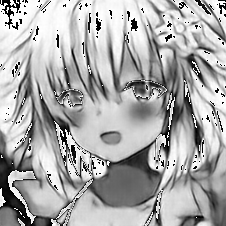

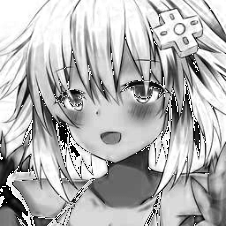

at iteration  50


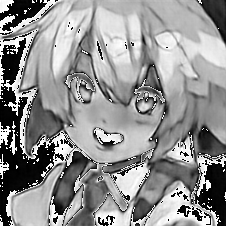

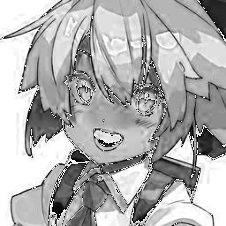

at iteration  100


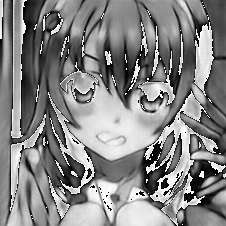

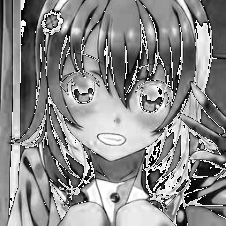

at iteration  150


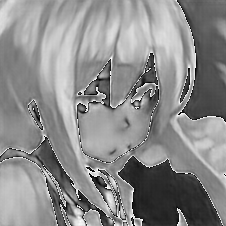

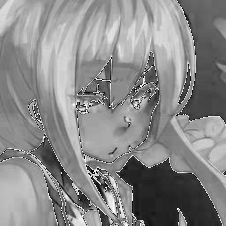

at iteration  200


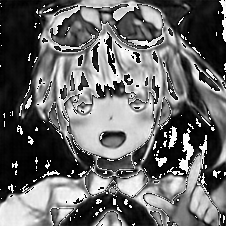

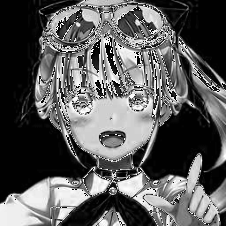

at iteration  250


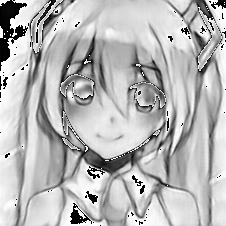

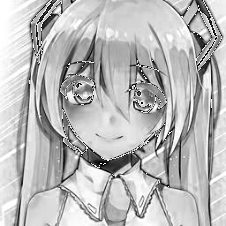

at iteration  300


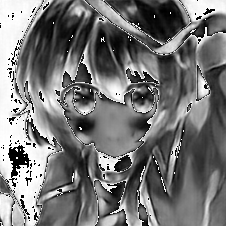

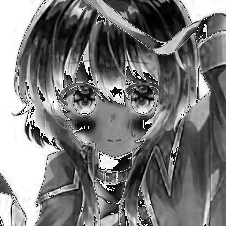

at iteration  350


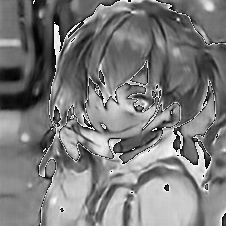

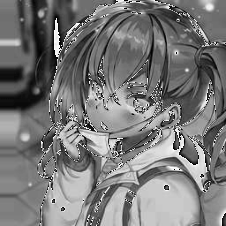

at iteration  400


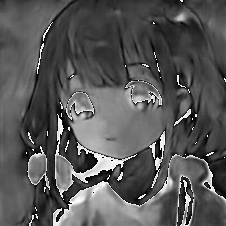

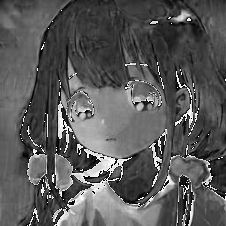

at iteration  450


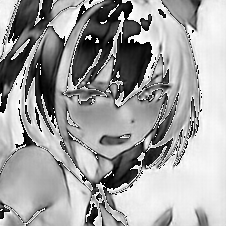

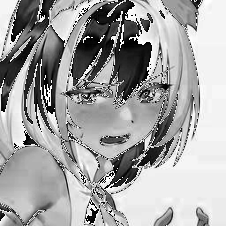

at iteration  500


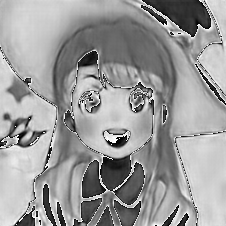

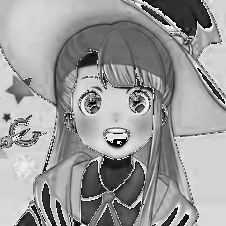

at iteration  550


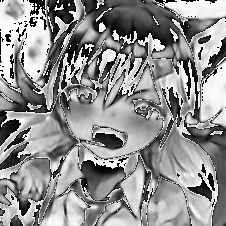

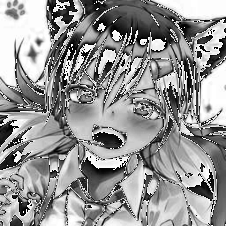

at iteration  600


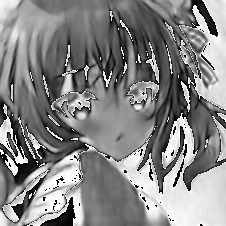

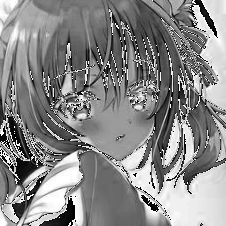

at iteration  650


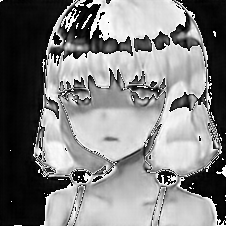

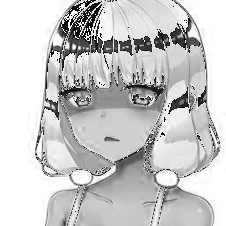

at iteration  700


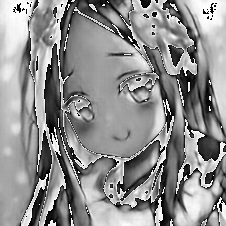

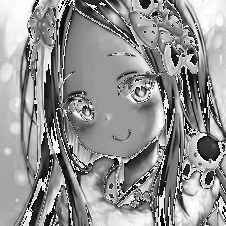

at iteration  750


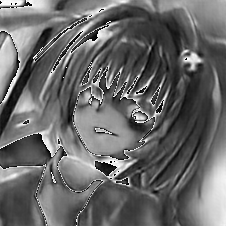

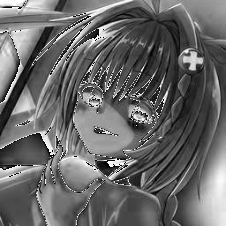

at iteration  800


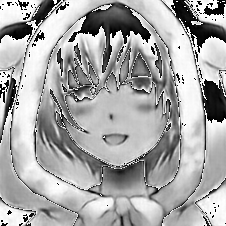

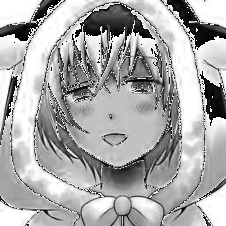

at iteration  850


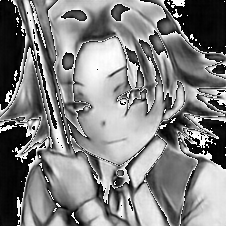

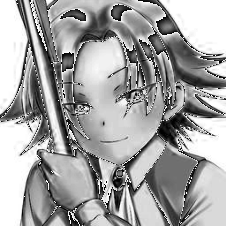

at iteration  900


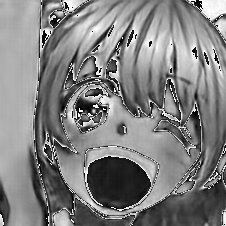

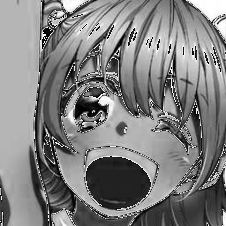

at iteration  950


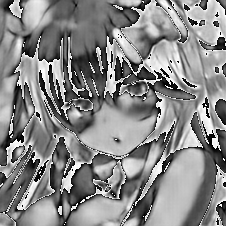

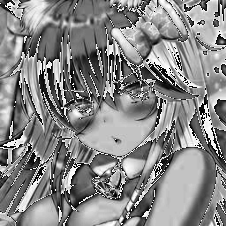

at iteration  1000


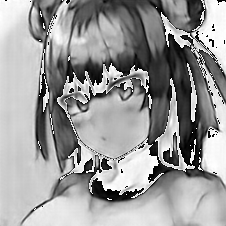

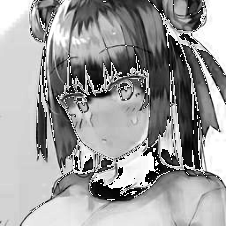

at iteration  1050


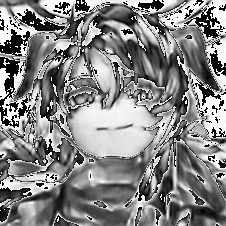

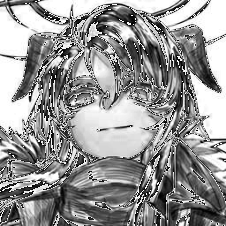

at iteration  1100


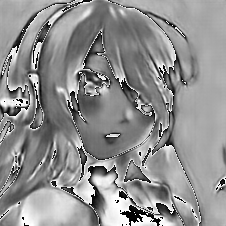

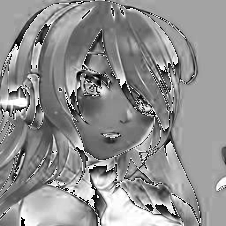

at iteration  1150


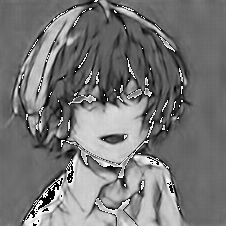

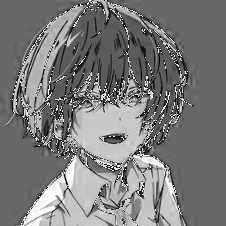

at iteration  1200


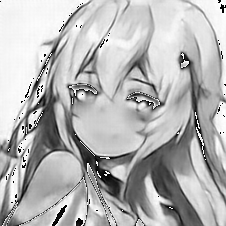

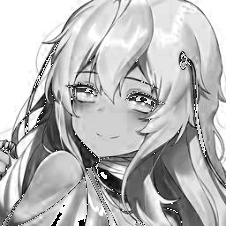

at iteration  1250


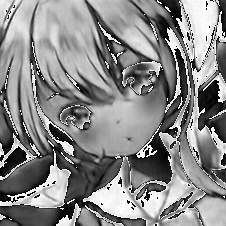

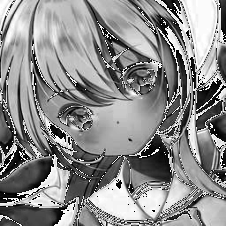

at iteration  1300


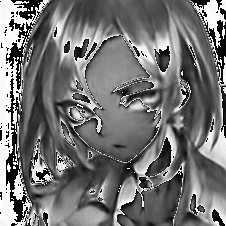

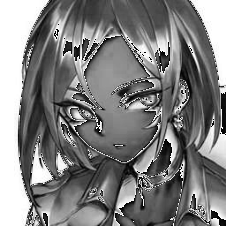

at iteration  1350


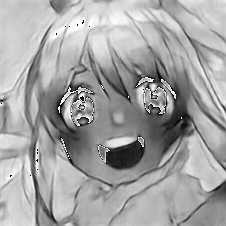

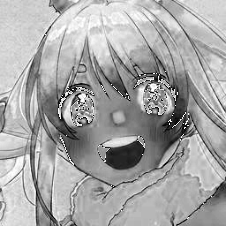

at iteration  1400


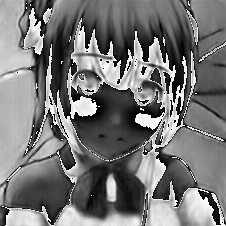

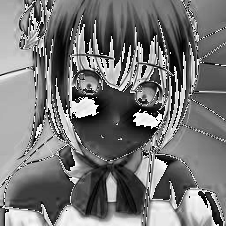

at iteration  1450


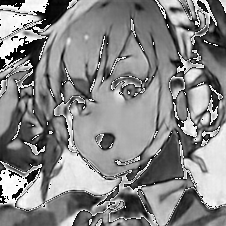

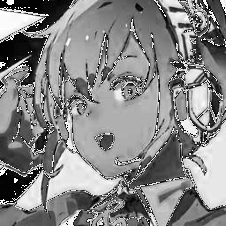

at iteration  1500


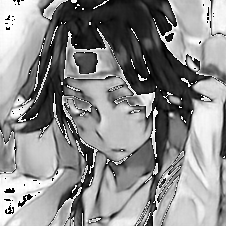

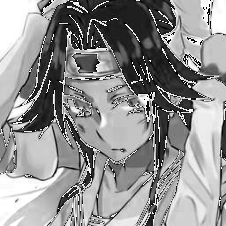

at iteration  1550


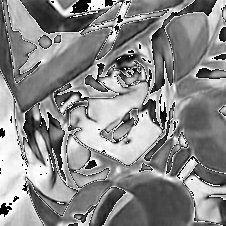

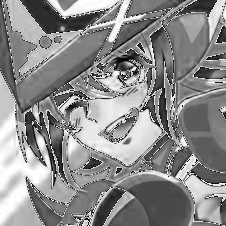

at iteration  1600


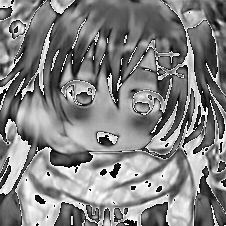

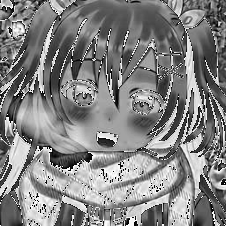

at iteration  1650


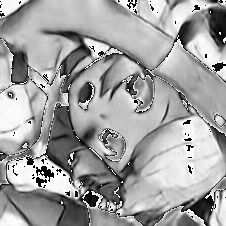

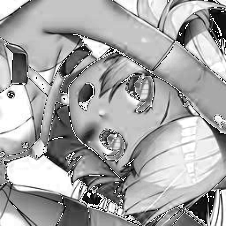

at iteration  1700


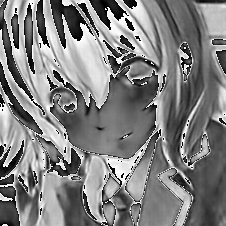

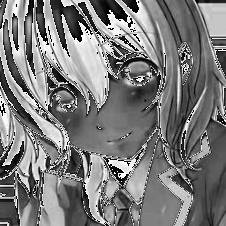

at iteration  1750


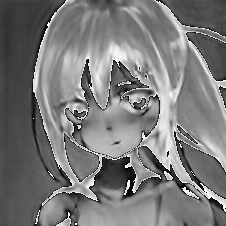

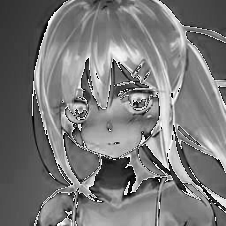

at iteration  1800


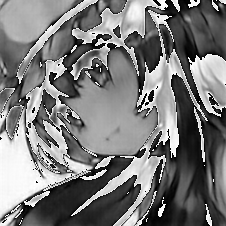

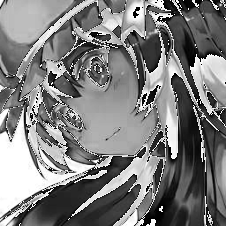

at iteration  1850


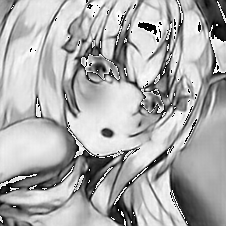

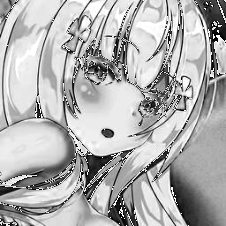

at iteration  1900


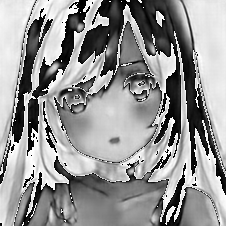

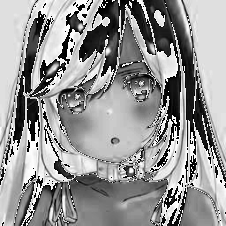

at iteration  1950


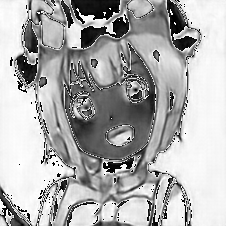

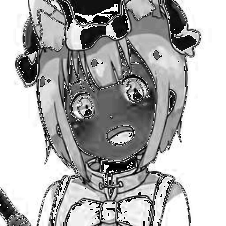

at iteration  2000


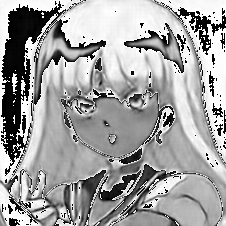

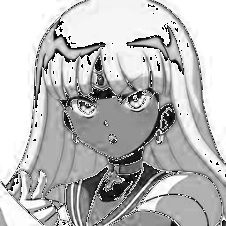

at iteration  2050


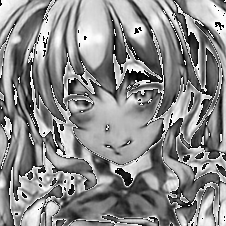

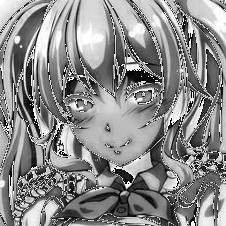

at iteration  2100


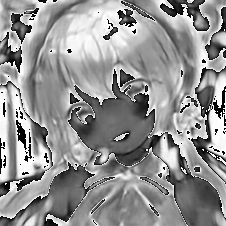

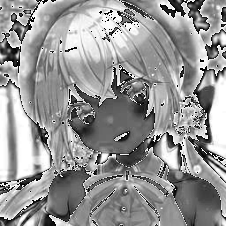

at iteration  2150


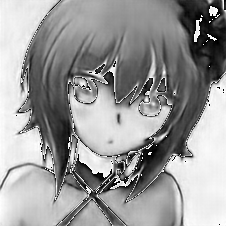

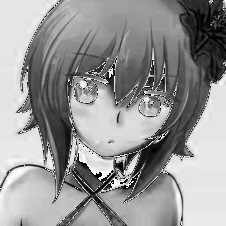

at iteration  2200


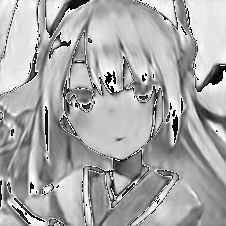

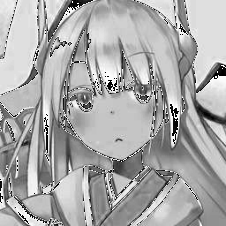

at iteration  2250


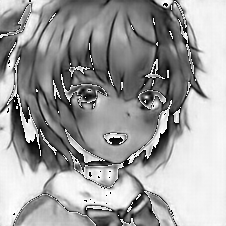

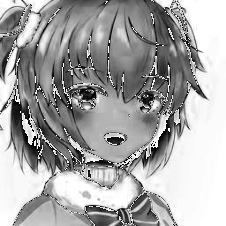

at iteration  2300


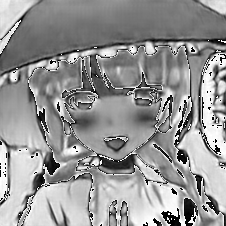

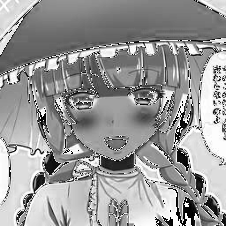

at iteration  2350


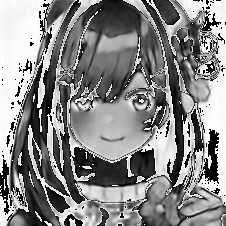

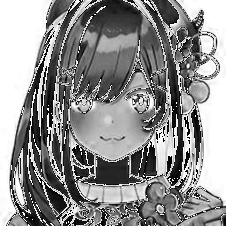

at iteration  2400


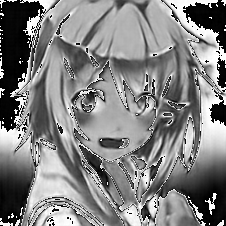

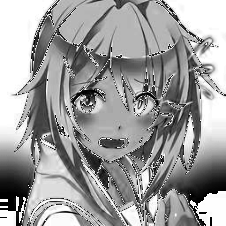

at iteration  2450


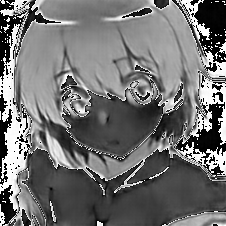

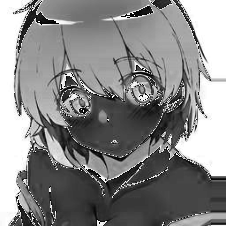

at iteration  2500


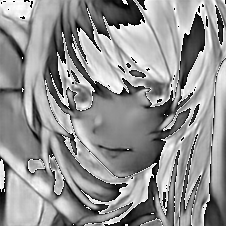

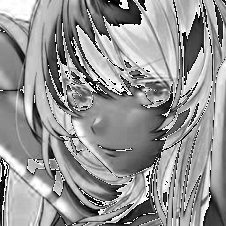

at iteration  2550


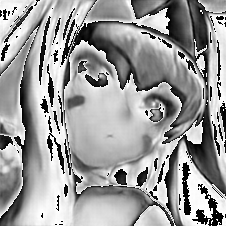

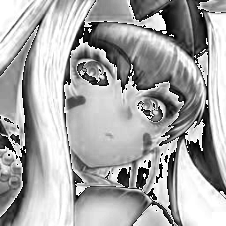

at iteration  2600


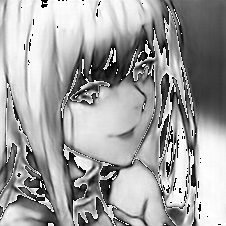

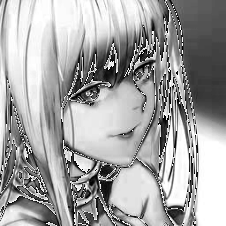

at iteration  2650


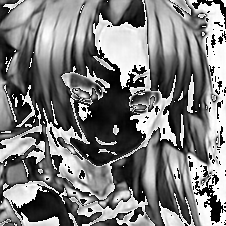

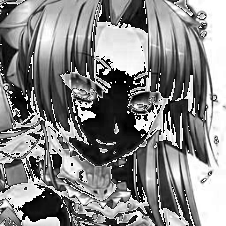

at iteration  2700


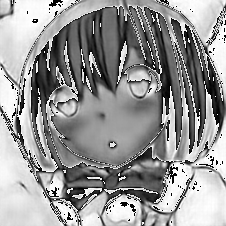

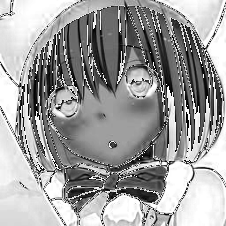

at iteration  2750


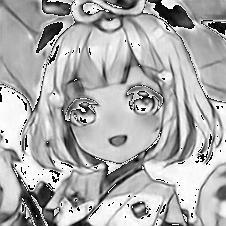

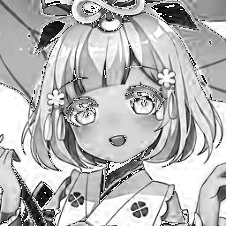

at iteration  2800


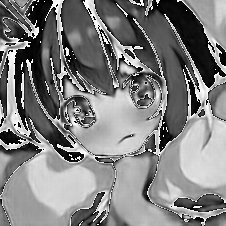

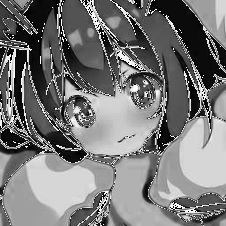

at iteration  2850


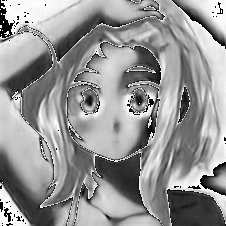

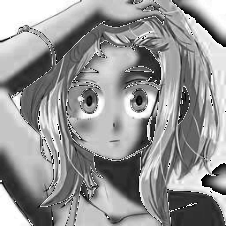

at iteration  2900


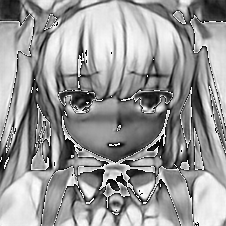

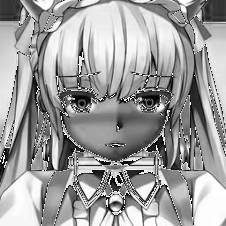

at iteration  2950


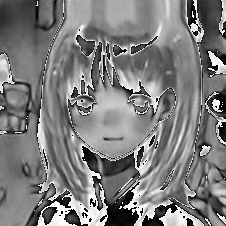

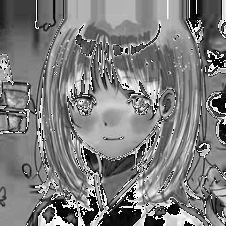

at iteration  3000


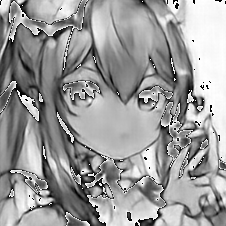

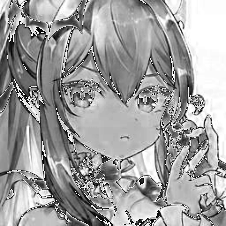

at iteration  3050


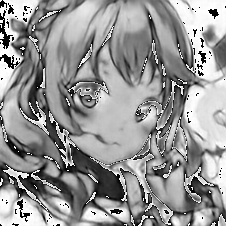

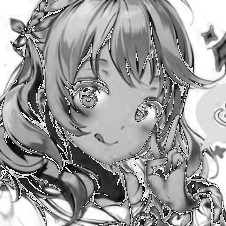

at iteration  3100


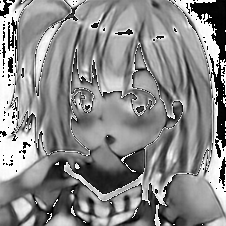

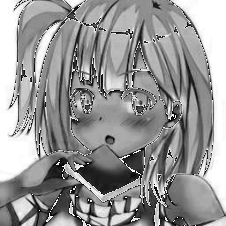

at iteration  3150


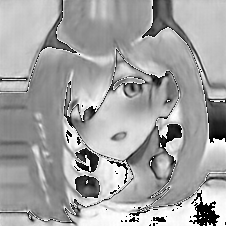

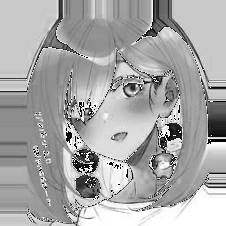

at iteration  3200


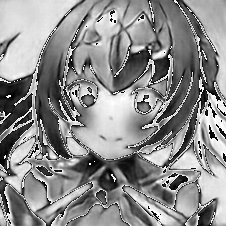

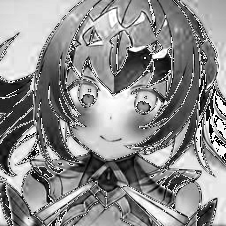

at iteration  3250


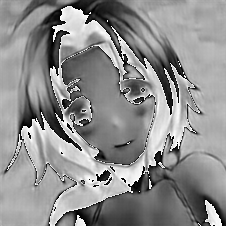

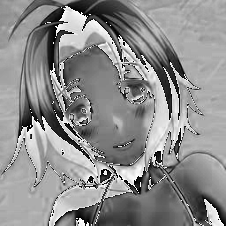

at iteration  3300


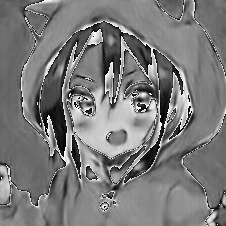

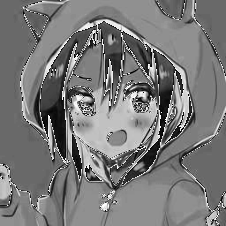

at iteration  3350


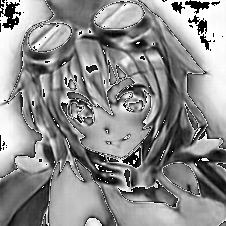

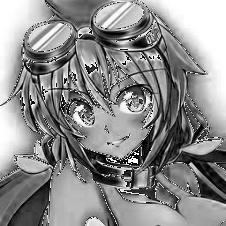

at iteration  3400


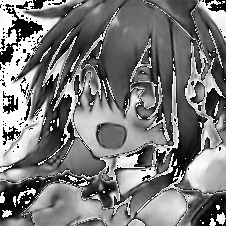

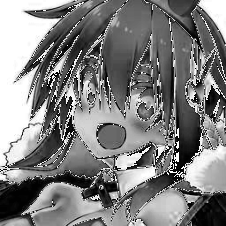

at iteration  3450


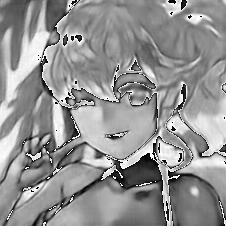

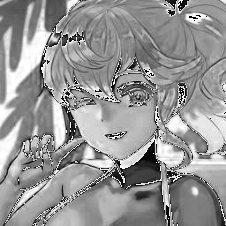

at iteration  3500


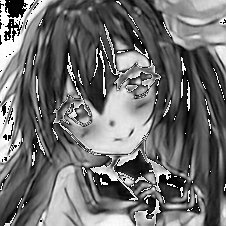

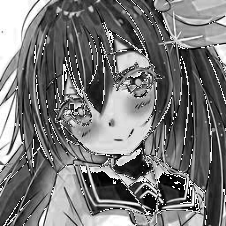

at iteration  3550


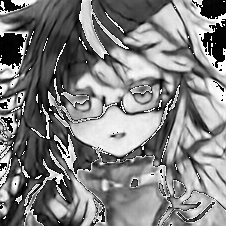

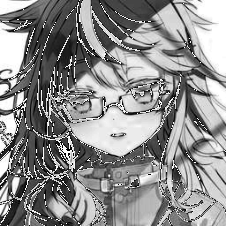

at iteration  3600


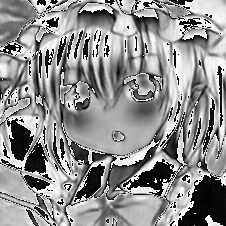

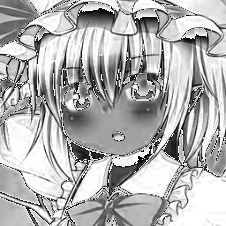

at iteration  3650


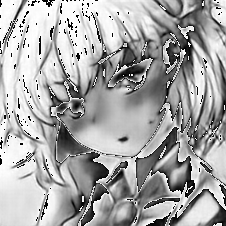

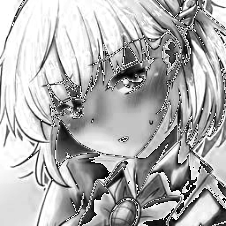

at iteration  3700


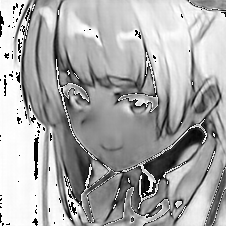

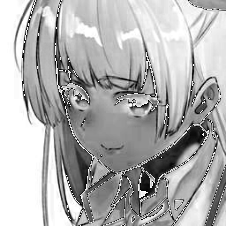

at iteration  3750


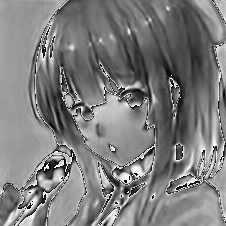

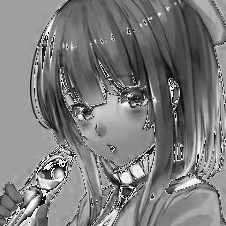

at iteration  3800


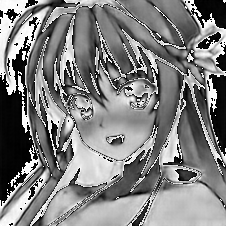

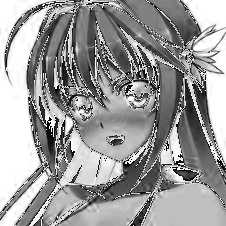

at iteration  3850


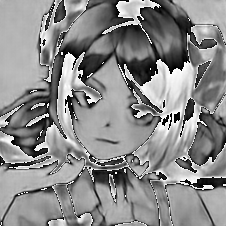

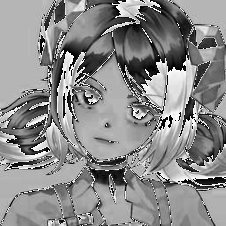

at iteration  3900


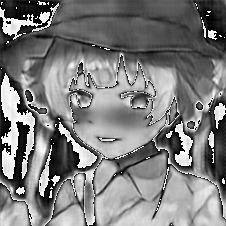

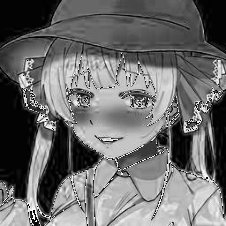

at iteration  3950


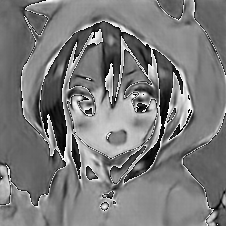

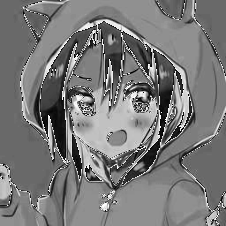

at iteration  4000


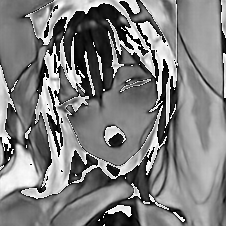

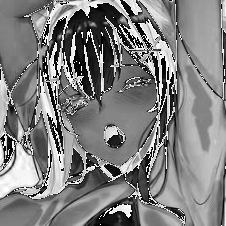

at iteration  4050


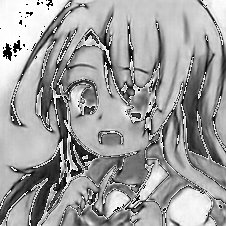

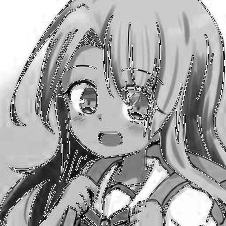

at iteration  4100


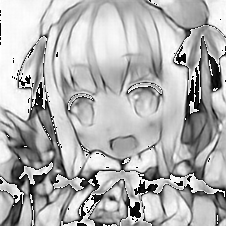

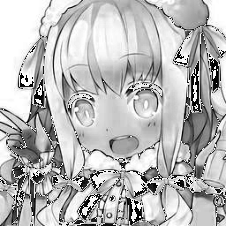

at iteration  4150


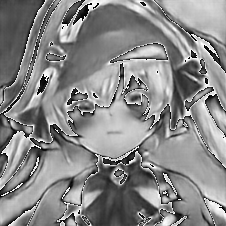

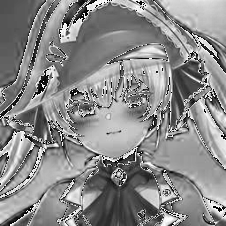

at iteration  4200


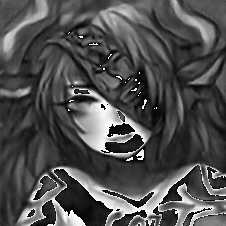

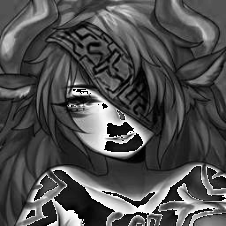

at iteration  4250


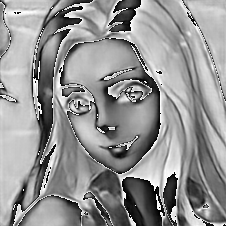

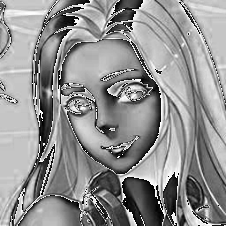

at iteration  4300


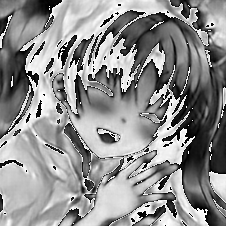

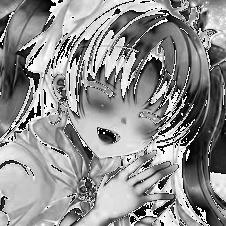

at iteration  4350


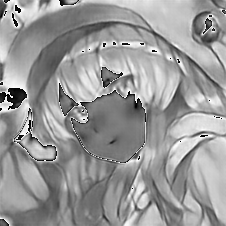

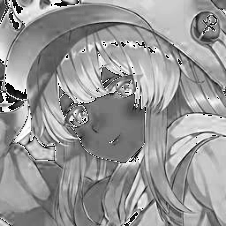

at iteration  4400


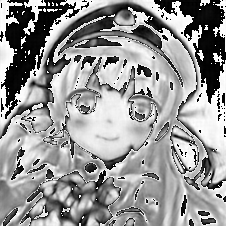

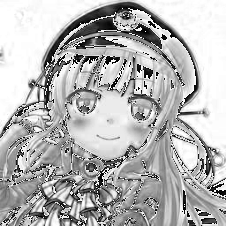

at iteration  4450


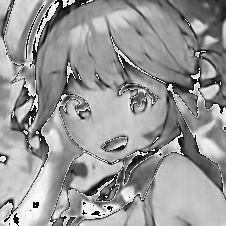

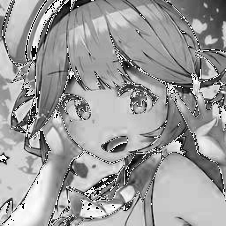

at iteration  4500


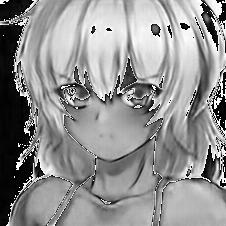

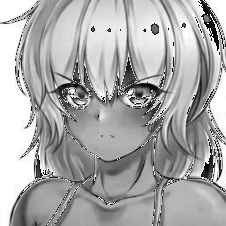

at iteration  4550


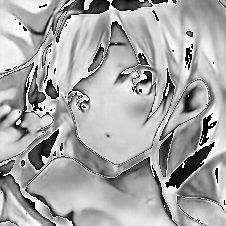

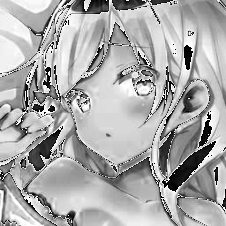

at iteration  4600


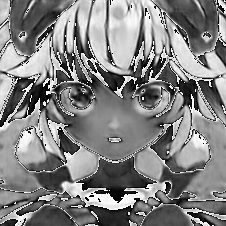

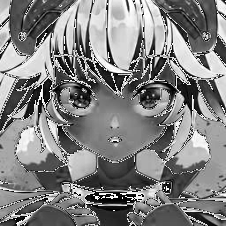

at iteration  4650


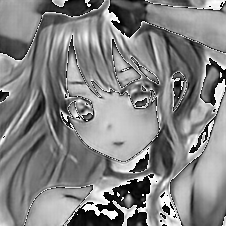

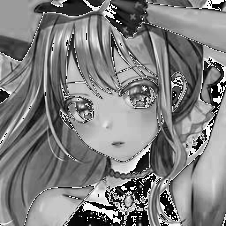

at iteration  4700


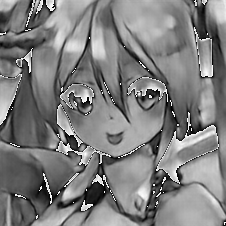

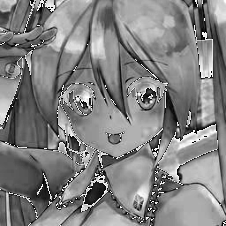

at iteration  4750


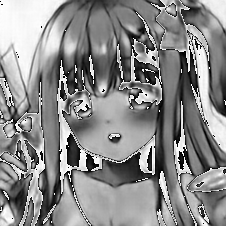

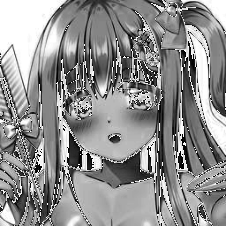

at iteration  4800


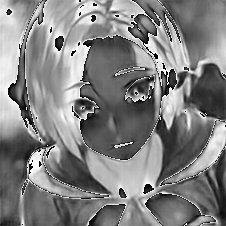

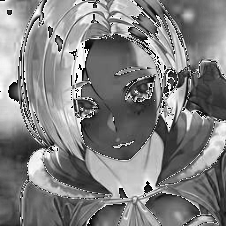

at iteration  4850


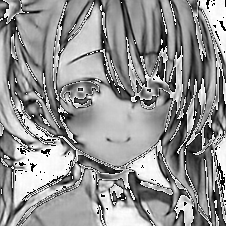

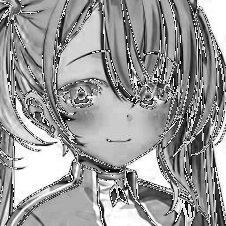

at iteration  4900


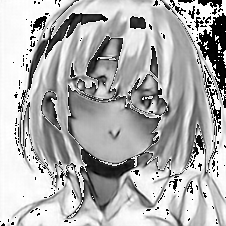

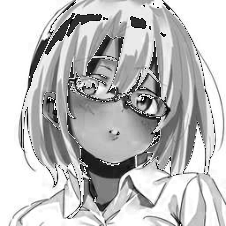

at iteration  4950


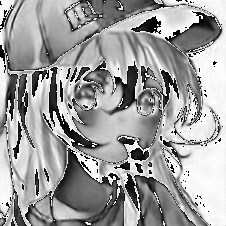

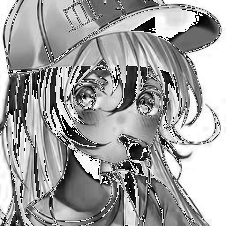

In [ ]:
train_generator(num_of_iter, generator, data_loader, dev, MSELoss())

In [ ]:
from torch.optim import Adam

def train_gan(num_of_iter, batch_size, device_type, data_loader, generator, discriminator):
  optimizer_gen = Adam(generator.parameters(), lr=0.0001)
  optimizer_disc = Adam(discriminator.parameters(), lr=0.00001)
  iterator = iter(data_loader)

  # moving the models in GPU
  generator.to(device_type)
  discriminator.to(device_type)

  mse_loss = MSELoss()
  adversarial_loss = AdversarialLoss(discriminator)
  discriminator_loss = DiscriminatorLoss(discriminator)

  for iteration in range(num_of_iter):
    # zeroing the gradients with set_to_none=True should be faster since memset is not called
    optimizer_gen.zero_grad(set_to_none=True) 
    optimizer_disc.zero_grad(set_to_none=True)
    # getting the next batch
    batch, id = next(iterator)
    low_res_imgs = batch['low_res'].to(device_type)
    high_res_imgs = batch['high_res'].to(device_type)
    # generating the upscaled images
    upscaled_images = generator(low_res_imgs)
    # adding batch number as a dimension to the tensor shape 
    loss_adv = adversarial_loss(upscaled_images[0].unsqueeze(0))

    for i in range(1, len(upscaled_images)):
      loss_adv += adversarial_loss(upscaled_images[i].unsqueeze(0))  

    # evaluting content loss
    loss_mse = mse_loss(upscaled_images[0].unsqueeze(0), high_res_imgs[0].unsqueeze(0))

    for i in range(1, len(high_res_imgs)):
      loss_mse += mse_loss(upscaled_images[i].unsqueeze(0), high_res_imgs[i].unsqueeze(0))

    # computing the final loss for the generator
    losses_sum = torch.div((loss_mse + 0.001 * loss_adv), batch_size)

    print("generator loss ", losses_sum, " at iter ", iteration)

    # retain_graph was set to True since the next loss to compute has a shared tensor with the one already evaluted
    losses_sum.backward(retain_graph=True)
    # updating generator's parameters
    optimizer_gen.step()

    loss_disc = discriminator_loss(upscaled_images[0].unsqueeze(0), high_res_imgs[0].unsqueeze(0))

    for i in range(1, len(upscaled_images)):
      loss_disc += discriminator_loss(upscaled_images[i].unsqueeze(0), high_res_imgs[i].unsqueeze(0))

    # loss is multiplied by -1 in order to ascending the gradient later on when calling backward
    loss_disc = torch.div(-1 * loss_disc, batch_size)

    print("discriminator loss ", loss_disc, "at iter ", iteration)

    # ascending the gradient
    loss_disc.backward()

    # updating discriminator's parameters
    optimizer_disc.step() 

    if iteration % 10 == 0:
      print("at iteration ", iteration)
      transform = T.ToPILImage()
      upscaled_img = upscaled_images[0][0]
      high_res_img = high_res_imgs[0][0]
      img = transform(upscaled_img)
      img.show()
      img = transform(high_res_img)
      img.show()

/usr/local/lib/python3.9/dist-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


generator loss  tensor([[0.0349]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  0
discriminator loss  tensor([[2.8161]], device='cuda:0', grad_fn=<DivBackward0>) at iter  0
at iteration  0


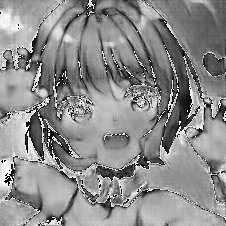

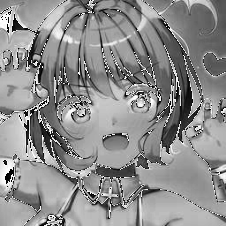

generator loss  tensor([[0.0483]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  1
discriminator loss  tensor([[3.2671]], device='cuda:0', grad_fn=<DivBackward0>) at iter  1
generator loss  tensor([[0.0324]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  2
discriminator loss  tensor([[3.0023]], device='cuda:0', grad_fn=<DivBackward0>) at iter  2
generator loss  tensor([[0.0326]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  3
discriminator loss  tensor([[2.9709]], device='cuda:0', grad_fn=<DivBackward0>) at iter  3
generator loss  tensor([[0.0374]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  4
discriminator loss  tensor([[2.7154]], device='cuda:0', grad_fn=<DivBackward0>) at iter  4
generator loss  tensor([[0.0367]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  5
discriminator loss  tensor([[2.8562]], device='cuda:0', grad_fn=<DivBackward0>) at iter  5
generator loss  tensor([[0.0316]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  6
discriminator los

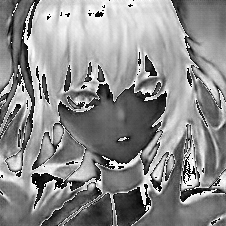

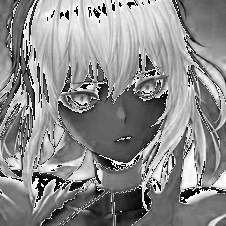

generator loss  tensor([[0.0353]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  11
discriminator loss  tensor([[2.5319]], device='cuda:0', grad_fn=<DivBackward0>) at iter  11
generator loss  tensor([[0.0337]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  12
discriminator loss  tensor([[2.5884]], device='cuda:0', grad_fn=<DivBackward0>) at iter  12
generator loss  tensor([[0.0302]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  13
discriminator loss  tensor([[2.6348]], device='cuda:0', grad_fn=<DivBackward0>) at iter  13
generator loss  tensor([[0.0297]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  14
discriminator loss  tensor([[2.5682]], device='cuda:0', grad_fn=<DivBackward0>) at iter  14
generator loss  tensor([[0.0296]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  15
discriminator loss  tensor([[2.5589]], device='cuda:0', grad_fn=<DivBackward0>) at iter  15
generator loss  tensor([[0.0349]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  16
discri

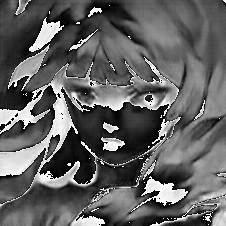

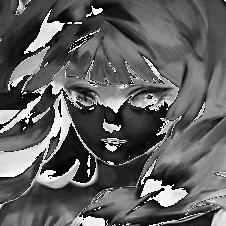

generator loss  tensor([[0.0338]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  21
discriminator loss  tensor([[2.5474]], device='cuda:0', grad_fn=<DivBackward0>) at iter  21
generator loss  tensor([[0.0329]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  22
discriminator loss  tensor([[2.4433]], device='cuda:0', grad_fn=<DivBackward0>) at iter  22
generator loss  tensor([[0.0332]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  23
discriminator loss  tensor([[2.4773]], device='cuda:0', grad_fn=<DivBackward0>) at iter  23
generator loss  tensor([[0.0326]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  24
discriminator loss  tensor([[2.5070]], device='cuda:0', grad_fn=<DivBackward0>) at iter  24
generator loss  tensor([[0.0283]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  25
discriminator loss  tensor([[2.5533]], device='cuda:0', grad_fn=<DivBackward0>) at iter  25
generator loss  tensor([[0.0317]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  26
discri

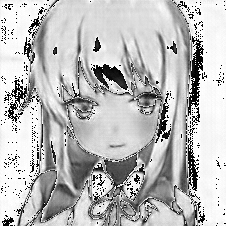

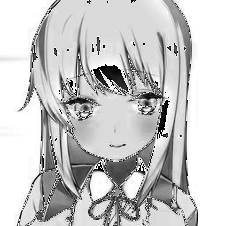

generator loss  tensor([[0.0310]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  31
discriminator loss  tensor([[2.4024]], device='cuda:0', grad_fn=<DivBackward0>) at iter  31
generator loss  tensor([[0.0279]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  32
discriminator loss  tensor([[2.4484]], device='cuda:0', grad_fn=<DivBackward0>) at iter  32
generator loss  tensor([[0.0336]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  33
discriminator loss  tensor([[2.4065]], device='cuda:0', grad_fn=<DivBackward0>) at iter  33
generator loss  tensor([[0.0299]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  34
discriminator loss  tensor([[2.4341]], device='cuda:0', grad_fn=<DivBackward0>) at iter  34
generator loss  tensor([[0.0306]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  35
discriminator loss  tensor([[2.4794]], device='cuda:0', grad_fn=<DivBackward0>) at iter  35
generator loss  tensor([[0.0277]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  36
discri

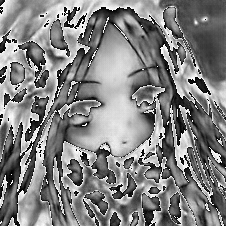

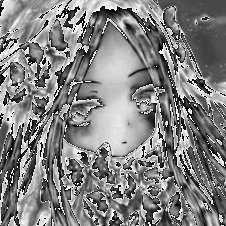

generator loss  tensor([[0.0279]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  41
discriminator loss  tensor([[2.4087]], device='cuda:0', grad_fn=<DivBackward0>) at iter  41
generator loss  tensor([[0.0283]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  42
discriminator loss  tensor([[2.4226]], device='cuda:0', grad_fn=<DivBackward0>) at iter  42
generator loss  tensor([[0.0326]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  43
discriminator loss  tensor([[2.3813]], device='cuda:0', grad_fn=<DivBackward0>) at iter  43
generator loss  tensor([[0.0276]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  44
discriminator loss  tensor([[2.3771]], device='cuda:0', grad_fn=<DivBackward0>) at iter  44
generator loss  tensor([[0.0286]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  45
discriminator loss  tensor([[2.4355]], device='cuda:0', grad_fn=<DivBackward0>) at iter  45
generator loss  tensor([[0.0323]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  46
discri

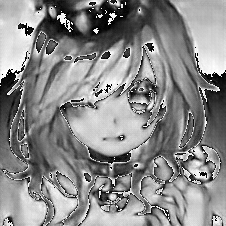

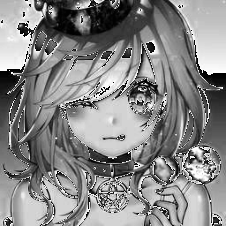

generator loss  tensor([[0.0328]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  51
discriminator loss  tensor([[2.3186]], device='cuda:0', grad_fn=<DivBackward0>) at iter  51
generator loss  tensor([[0.0315]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  52
discriminator loss  tensor([[2.3726]], device='cuda:0', grad_fn=<DivBackward0>) at iter  52
generator loss  tensor([[0.0290]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  53
discriminator loss  tensor([[2.4377]], device='cuda:0', grad_fn=<DivBackward0>) at iter  53
generator loss  tensor([[0.0319]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  54
discriminator loss  tensor([[2.3387]], device='cuda:0', grad_fn=<DivBackward0>) at iter  54
generator loss  tensor([[0.0295]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  55
discriminator loss  tensor([[2.4739]], device='cuda:0', grad_fn=<DivBackward0>) at iter  55
generator loss  tensor([[0.0316]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  56
discri

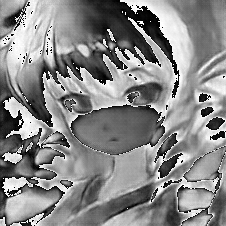

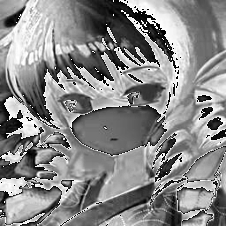

generator loss  tensor([[0.0301]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  61
discriminator loss  tensor([[2.2639]], device='cuda:0', grad_fn=<DivBackward0>) at iter  61
generator loss  tensor([[0.0313]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  62
discriminator loss  tensor([[2.3074]], device='cuda:0', grad_fn=<DivBackward0>) at iter  62
generator loss  tensor([[0.0293]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  63
discriminator loss  tensor([[2.2864]], device='cuda:0', grad_fn=<DivBackward0>) at iter  63
generator loss  tensor([[0.0319]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  64
discriminator loss  tensor([[2.2722]], device='cuda:0', grad_fn=<DivBackward0>) at iter  64
generator loss  tensor([[0.0297]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  65
discriminator loss  tensor([[2.2798]], device='cuda:0', grad_fn=<DivBackward0>) at iter  65
generator loss  tensor([[0.0318]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  66
discri

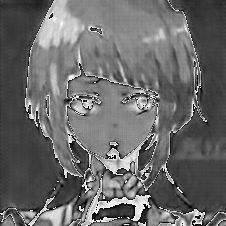

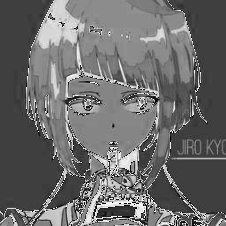

generator loss  tensor([[0.0311]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  71
discriminator loss  tensor([[2.2175]], device='cuda:0', grad_fn=<DivBackward0>) at iter  71
generator loss  tensor([[0.0294]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  72
discriminator loss  tensor([[2.3662]], device='cuda:0', grad_fn=<DivBackward0>) at iter  72
generator loss  tensor([[0.0292]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  73
discriminator loss  tensor([[2.3586]], device='cuda:0', grad_fn=<DivBackward0>) at iter  73
generator loss  tensor([[0.0356]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  74
discriminator loss  tensor([[2.1327]], device='cuda:0', grad_fn=<DivBackward0>) at iter  74
generator loss  tensor([[0.0295]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  75
discriminator loss  tensor([[2.4059]], device='cuda:0', grad_fn=<DivBackward0>) at iter  75
generator loss  tensor([[0.0319]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  76
discri

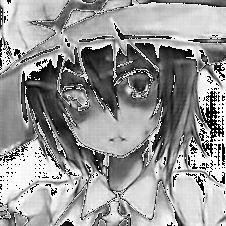

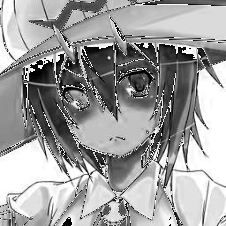

generator loss  tensor([[0.0326]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  81
discriminator loss  tensor([[2.4116]], device='cuda:0', grad_fn=<DivBackward0>) at iter  81
generator loss  tensor([[0.0342]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  82
discriminator loss  tensor([[2.1880]], device='cuda:0', grad_fn=<DivBackward0>) at iter  82
generator loss  tensor([[0.0319]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  83
discriminator loss  tensor([[2.3309]], device='cuda:0', grad_fn=<DivBackward0>) at iter  83
generator loss  tensor([[0.0300]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  84
discriminator loss  tensor([[2.5741]], device='cuda:0', grad_fn=<DivBackward0>) at iter  84
generator loss  tensor([[0.0299]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  85
discriminator loss  tensor([[2.5718]], device='cuda:0', grad_fn=<DivBackward0>) at iter  85
generator loss  tensor([[0.0307]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  86
discri

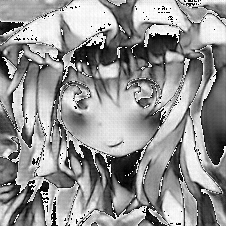

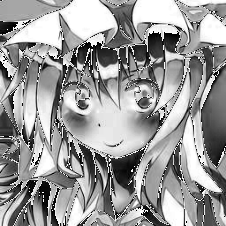

generator loss  tensor([[0.0300]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  91
discriminator loss  tensor([[2.3795]], device='cuda:0', grad_fn=<DivBackward0>) at iter  91
generator loss  tensor([[0.0295]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  92
discriminator loss  tensor([[2.5260]], device='cuda:0', grad_fn=<DivBackward0>) at iter  92
generator loss  tensor([[0.0314]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  93
discriminator loss  tensor([[2.3607]], device='cuda:0', grad_fn=<DivBackward0>) at iter  93
generator loss  tensor([[0.0287]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  94
discriminator loss  tensor([[2.4351]], device='cuda:0', grad_fn=<DivBackward0>) at iter  94
generator loss  tensor([[0.0324]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  95
discriminator loss  tensor([[2.2165]], device='cuda:0', grad_fn=<DivBackward0>) at iter  95
generator loss  tensor([[0.0319]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  96
discri

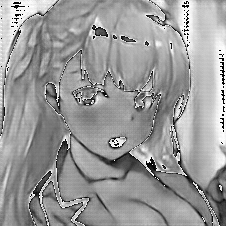

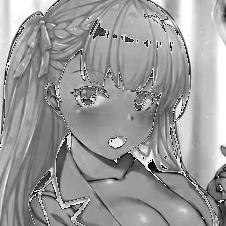

generator loss  tensor([[0.0316]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  101
discriminator loss  tensor([[2.1527]], device='cuda:0', grad_fn=<DivBackward0>) at iter  101
generator loss  tensor([[0.0325]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  102
discriminator loss  tensor([[2.4037]], device='cuda:0', grad_fn=<DivBackward0>) at iter  102
generator loss  tensor([[0.0306]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  103
discriminator loss  tensor([[2.6841]], device='cuda:0', grad_fn=<DivBackward0>) at iter  103
generator loss  tensor([[0.0297]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  104
discriminator loss  tensor([[2.8984]], device='cuda:0', grad_fn=<DivBackward0>) at iter  104
generator loss  tensor([[0.0297]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  105
discriminator loss  tensor([[3.1656]], device='cuda:0', grad_fn=<DivBackward0>) at iter  105
generator loss  tensor([[0.0312]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

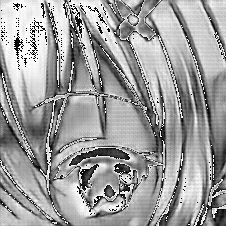

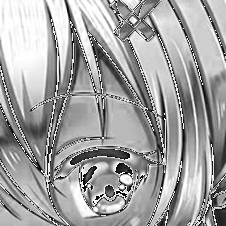

generator loss  tensor([[0.0323]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  111
discriminator loss  tensor([[3.3006]], device='cuda:0', grad_fn=<DivBackward0>) at iter  111
generator loss  tensor([[0.0291]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  112
discriminator loss  tensor([[3.3530]], device='cuda:0', grad_fn=<DivBackward0>) at iter  112
generator loss  tensor([[0.0303]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  113
discriminator loss  tensor([[2.6604]], device='cuda:0', grad_fn=<DivBackward0>) at iter  113
generator loss  tensor([[0.0289]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  114
discriminator loss  tensor([[2.6719]], device='cuda:0', grad_fn=<DivBackward0>) at iter  114
generator loss  tensor([[0.0321]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  115
discriminator loss  tensor([[2.4829]], device='cuda:0', grad_fn=<DivBackward0>) at iter  115
generator loss  tensor([[0.0333]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

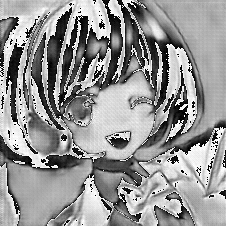

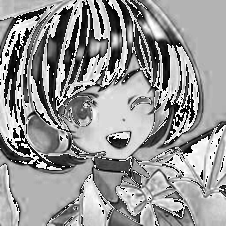

generator loss  tensor([[0.0315]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  121
discriminator loss  tensor([[2.4248]], device='cuda:0', grad_fn=<DivBackward0>) at iter  121
generator loss  tensor([[0.0337]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  122
discriminator loss  tensor([[2.5620]], device='cuda:0', grad_fn=<DivBackward0>) at iter  122
generator loss  tensor([[0.0349]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  123
discriminator loss  tensor([[2.7001]], device='cuda:0', grad_fn=<DivBackward0>) at iter  123
generator loss  tensor([[0.0302]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  124
discriminator loss  tensor([[3.0090]], device='cuda:0', grad_fn=<DivBackward0>) at iter  124
generator loss  tensor([[0.0292]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  125
discriminator loss  tensor([[3.4454]], device='cuda:0', grad_fn=<DivBackward0>) at iter  125
generator loss  tensor([[0.0339]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

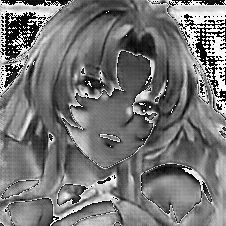

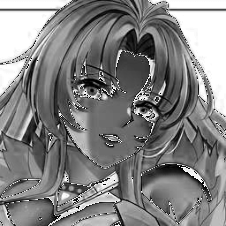

generator loss  tensor([[0.0286]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  131
discriminator loss  tensor([[4.4009]], device='cuda:0', grad_fn=<DivBackward0>) at iter  131
generator loss  tensor([[0.0293]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  132
discriminator loss  tensor([[3.7456]], device='cuda:0', grad_fn=<DivBackward0>) at iter  132
generator loss  tensor([[0.0348]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  133
discriminator loss  tensor([[3.2300]], device='cuda:0', grad_fn=<DivBackward0>) at iter  133
generator loss  tensor([[0.0316]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  134
discriminator loss  tensor([[3.3387]], device='cuda:0', grad_fn=<DivBackward0>) at iter  134
generator loss  tensor([[0.0335]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  135
discriminator loss  tensor([[2.7984]], device='cuda:0', grad_fn=<DivBackward0>) at iter  135
generator loss  tensor([[0.0398]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

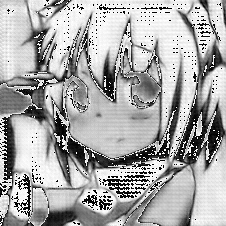

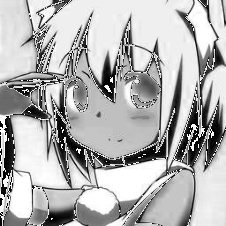

generator loss  tensor([[0.0320]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  141
discriminator loss  tensor([[2.4316]], device='cuda:0', grad_fn=<DivBackward0>) at iter  141
generator loss  tensor([[0.0296]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  142
discriminator loss  tensor([[2.3108]], device='cuda:0', grad_fn=<DivBackward0>) at iter  142
generator loss  tensor([[0.0302]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  143
discriminator loss  tensor([[2.3631]], device='cuda:0', grad_fn=<DivBackward0>) at iter  143
generator loss  tensor([[0.0307]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  144
discriminator loss  tensor([[2.4698]], device='cuda:0', grad_fn=<DivBackward0>) at iter  144
generator loss  tensor([[0.0275]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  145
discriminator loss  tensor([[3.0110]], device='cuda:0', grad_fn=<DivBackward0>) at iter  145
generator loss  tensor([[0.0304]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

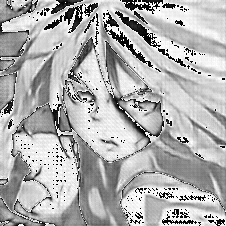

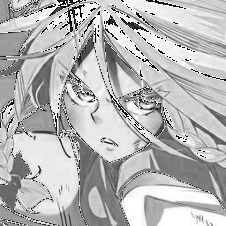

generator loss  tensor([[0.0297]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  151
discriminator loss  tensor([[4.8315]], device='cuda:0', grad_fn=<DivBackward0>) at iter  151
generator loss  tensor([[0.0289]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  152
discriminator loss  tensor([[5.0539]], device='cuda:0', grad_fn=<DivBackward0>) at iter  152
generator loss  tensor([[0.0311]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  153
discriminator loss  tensor([[4.5833]], device='cuda:0', grad_fn=<DivBackward0>) at iter  153
generator loss  tensor([[0.0273]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  154
discriminator loss  tensor([[4.7135]], device='cuda:0', grad_fn=<DivBackward0>) at iter  154
generator loss  tensor([[0.0313]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  155
discriminator loss  tensor([[4.1131]], device='cuda:0', grad_fn=<DivBackward0>) at iter  155
generator loss  tensor([[0.0302]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

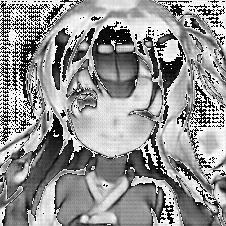

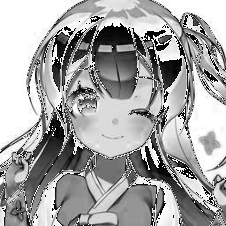

generator loss  tensor([[0.0291]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  161
discriminator loss  tensor([[2.9932]], device='cuda:0', grad_fn=<DivBackward0>) at iter  161
generator loss  tensor([[0.0366]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  162
discriminator loss  tensor([[2.4995]], device='cuda:0', grad_fn=<DivBackward0>) at iter  162
generator loss  tensor([[0.0318]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  163
discriminator loss  tensor([[2.6770]], device='cuda:0', grad_fn=<DivBackward0>) at iter  163
generator loss  tensor([[0.0306]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  164
discriminator loss  tensor([[2.7851]], device='cuda:0', grad_fn=<DivBackward0>) at iter  164
generator loss  tensor([[0.0337]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  165
discriminator loss  tensor([[2.6141]], device='cuda:0', grad_fn=<DivBackward0>) at iter  165
generator loss  tensor([[0.0325]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

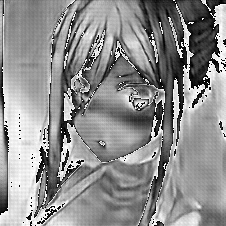

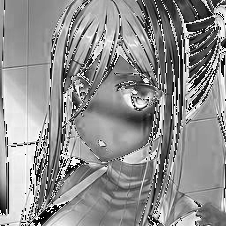

generator loss  tensor([[0.0303]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  171
discriminator loss  tensor([[3.0348]], device='cuda:0', grad_fn=<DivBackward0>) at iter  171
generator loss  tensor([[0.0342]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  172
discriminator loss  tensor([[2.8755]], device='cuda:0', grad_fn=<DivBackward0>) at iter  172
generator loss  tensor([[0.0329]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  173
discriminator loss  tensor([[3.2542]], device='cuda:0', grad_fn=<DivBackward0>) at iter  173
generator loss  tensor([[0.0365]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  174
discriminator loss  tensor([[3.0111]], device='cuda:0', grad_fn=<DivBackward0>) at iter  174
generator loss  tensor([[0.0303]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  175
discriminator loss  tensor([[3.0762]], device='cuda:0', grad_fn=<DivBackward0>) at iter  175
generator loss  tensor([[0.0323]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

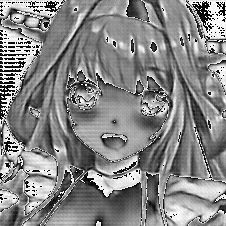

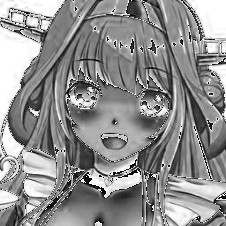

generator loss  tensor([[0.0298]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  181
discriminator loss  tensor([[3.0709]], device='cuda:0', grad_fn=<DivBackward0>) at iter  181
generator loss  tensor([[0.0292]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  182
discriminator loss  tensor([[2.7477]], device='cuda:0', grad_fn=<DivBackward0>) at iter  182
generator loss  tensor([[0.0372]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  183
discriminator loss  tensor([[2.5209]], device='cuda:0', grad_fn=<DivBackward0>) at iter  183
generator loss  tensor([[0.0337]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  184
discriminator loss  tensor([[2.6197]], device='cuda:0', grad_fn=<DivBackward0>) at iter  184
generator loss  tensor([[0.0326]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  185
discriminator loss  tensor([[2.7580]], device='cuda:0', grad_fn=<DivBackward0>) at iter  185
generator loss  tensor([[0.0290]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

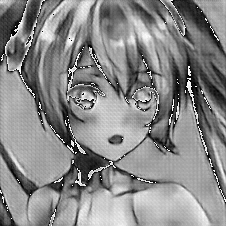

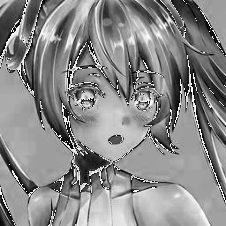

generator loss  tensor([[0.0301]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  191
discriminator loss  tensor([[2.6400]], device='cuda:0', grad_fn=<DivBackward0>) at iter  191
generator loss  tensor([[0.0322]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  192
discriminator loss  tensor([[2.6087]], device='cuda:0', grad_fn=<DivBackward0>) at iter  192
generator loss  tensor([[0.0323]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  193
discriminator loss  tensor([[2.9297]], device='cuda:0', grad_fn=<DivBackward0>) at iter  193
generator loss  tensor([[0.0325]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  194
discriminator loss  tensor([[2.9976]], device='cuda:0', grad_fn=<DivBackward0>) at iter  194
generator loss  tensor([[0.0331]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  195
discriminator loss  tensor([[2.8559]], device='cuda:0', grad_fn=<DivBackward0>) at iter  195
generator loss  tensor([[0.0292]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

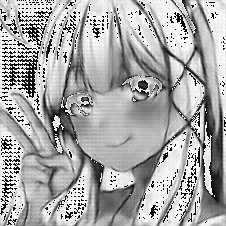

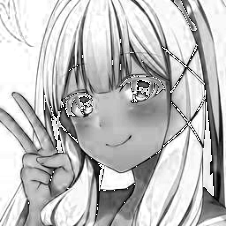

generator loss  tensor([[0.0337]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  201
discriminator loss  tensor([[2.9224]], device='cuda:0', grad_fn=<DivBackward0>) at iter  201
generator loss  tensor([[0.0323]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  202
discriminator loss  tensor([[3.0536]], device='cuda:0', grad_fn=<DivBackward0>) at iter  202
generator loss  tensor([[0.0290]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  203
discriminator loss  tensor([[3.1053]], device='cuda:0', grad_fn=<DivBackward0>) at iter  203
generator loss  tensor([[0.0297]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  204
discriminator loss  tensor([[3.0646]], device='cuda:0', grad_fn=<DivBackward0>) at iter  204
generator loss  tensor([[0.0281]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  205
discriminator loss  tensor([[3.0443]], device='cuda:0', grad_fn=<DivBackward0>) at iter  205
generator loss  tensor([[0.0268]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

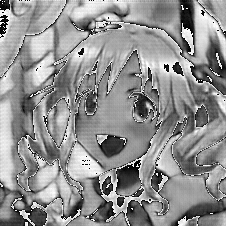

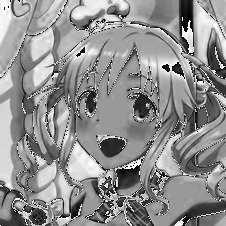

generator loss  tensor([[0.0314]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  211
discriminator loss  tensor([[2.5293]], device='cuda:0', grad_fn=<DivBackward0>) at iter  211
generator loss  tensor([[0.0295]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  212
discriminator loss  tensor([[2.7708]], device='cuda:0', grad_fn=<DivBackward0>) at iter  212
generator loss  tensor([[0.0314]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  213
discriminator loss  tensor([[2.6452]], device='cuda:0', grad_fn=<DivBackward0>) at iter  213
generator loss  tensor([[0.0310]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  214
discriminator loss  tensor([[2.8057]], device='cuda:0', grad_fn=<DivBackward0>) at iter  214
generator loss  tensor([[0.0285]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  215
discriminator loss  tensor([[2.8249]], device='cuda:0', grad_fn=<DivBackward0>) at iter  215
generator loss  tensor([[0.0330]], device='cuda:0', grad_fn=<DivBackward0>)  at iter 

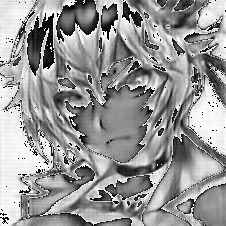

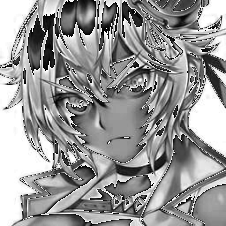

generator loss  tensor([[0.0326]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  221
discriminator loss  tensor([[3.8173]], device='cuda:0', grad_fn=<DivBackward0>) at iter  221
generator loss  tensor([[0.0305]], device='cuda:0', grad_fn=<DivBackward0>)  at iter  222
discriminator loss  tensor([[3.7832]], device='cuda:0', grad_fn=<DivBackward0>) at iter  222


In [ ]:
disc = Discriminator()
num_of_iter = 10000
batch_size = 16
train_gan(num_of_iter, batch_size, dev, data_loader, generator, disc)

In [ ]:
transform = T.ToPILImage()

state_dict_no_gan = torch.load('checkpoint_4.pth')
state_dict_gan = torch.load('checkpoint_gan_gen_3.pth')

gen_no_gan = Generator()
gen_gan = Generator()

gen_no_gan.load_state_dict(state_dict_no_gan)
gen_gan.load_state_dict(state_dict_gan)

iterator = iter(data_loader)
batch, id = next(iterator)

high_res_imgs = batch['high_res']
low_res_imgs = batch['low_res']

for i in range(batch_size):
  upscaled_imgs_no_gan = gen_no_gan(low_res_imgs)
  upscaled_imgs_gan = gen_gan(low_res_imgs)

  print("Image generated without GAN approach")
  img = transform(upscaled_imgs_no_gan[i])
  img.show()

  print("Image generated with GAN approach")
  img = transform(upscaled_imgs_gan[i])
  img.show()
  
  print("Ground truth")
  img = transform(high_res_imgs[i])
  img.show()